In [4]:
import sys
from tqdm import tqdm_notebook as tqdm

import numpy as np
import pandas as pd

from matplotlib import pyplot as plt
import seaborn as sns

sys.path.append('../')
from tools.utils.visualizations import num_feature_comp_hist

In [2]:
# re-load functions
%load_ext autoreload
%autoreload 2

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%config InlineBackend.figure_formats = {'png', 'retina'}

In [3]:
trn_df = pd.read_csv('../mnt/inputs/origin/train.csv.zip').set_index('ID_code')
tst_df = pd.read_csv('../mnt/inputs/origin/test.csv.zip').set_index('ID_code')
trn_df.head()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
ID_code,,,,,,,,,,,,,,,,,,,,,
train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,-4.9200,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,3.1468,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,-4.9193,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,-5.8609,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,6.2654,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [5]:
!ls ../mnt/inputs/nes_info/

private_LB.npz.npy		   target.pkl.gz
public_LB.npz.npy		   trn_ID_code.pkl.gz
real_samples_indexes.npz.npy	   tst_ID_code.pkl.gz
synthetic_samples_indexes.npz.npy


In [11]:
reals = np.load('../mnt/inputs/nes_info/real_samples_indexes.npz.npy')
fakes = np.load('../mnt/inputs/nes_info/synthetic_samples_indexes.npz.npy')
publics = np.load('../mnt/inputs/nes_info/public_LB.npz.npy')
privates = np.load('../mnt/inputs/nes_info/private_LB.npz.npy')

In [12]:
real_tst_df = tst_df.iloc[reals]
fake_tst_df = tst_df.iloc[fakes]
public_tst_df = tst_df.iloc[publics]
private_tst_df = tst_df.iloc[privates]

In [13]:
tst_df.shape, real_tst_df.shape, fake_tst_df.shape, public_tst_df.shape, private_tst_df.shape

((200000, 200), (100000, 200), (100000, 200), (50000, 200), (50000, 200))

## train vs real tests

/root/anaconda3/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


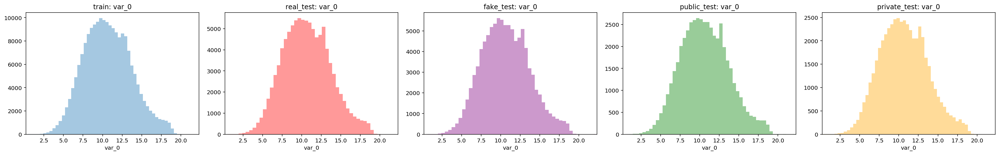

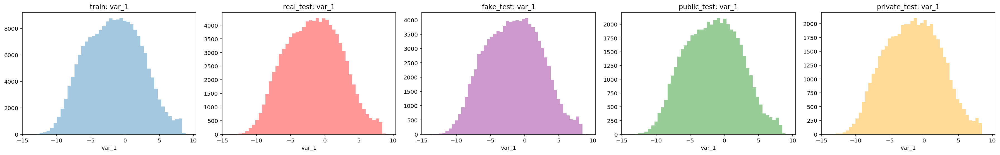

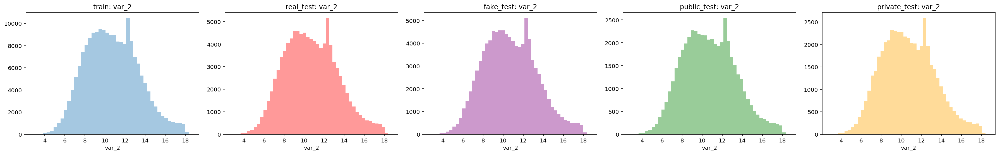

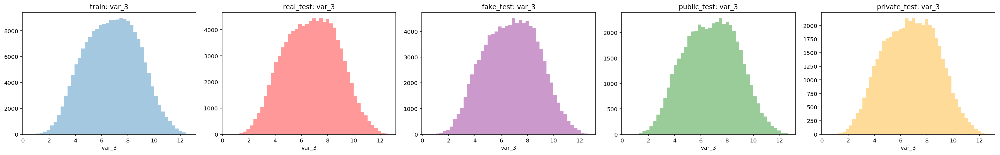

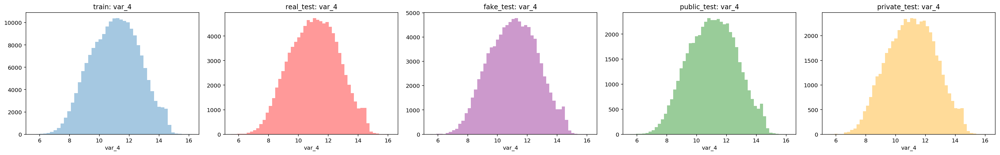

...

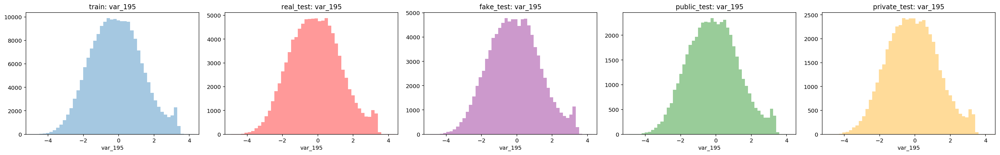

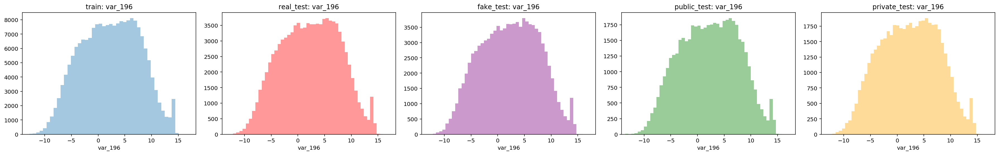

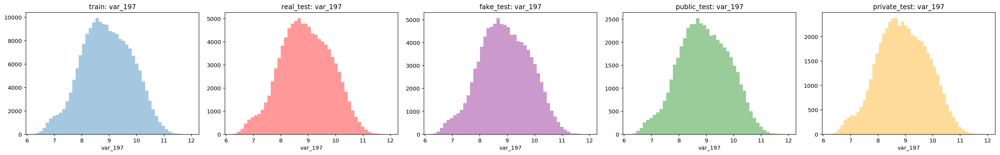

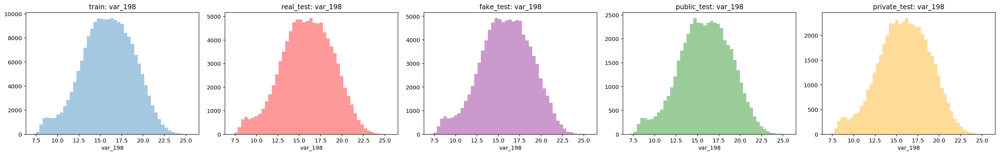

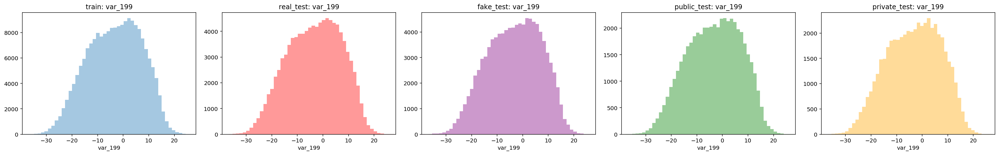

In [14]:
# plot each features
# %debug
for col in tqdm(tst_df.columns):
    num_feature_comp_hist(features=[trn_df[col], real_tst_df[col], fake_tst_df[col], public_tst_df[col], private_tst_df[col]], titles=[f'train: {col}', f'real_test: {col}', f'fake_test: {col}', f'public_test: {col}', f'private_test: {col}'], colors=[None, 'red', 'purple', 'green', 'orange'])

### 違和感
 - real もきれいな形なんだ...
     - fake の sampling の仕方ってどうなっているんだろう...
 - 異常値的に histgram が歪んでいる箇所